In [93]:
import numpy as np
import os
import pydicom as dicom
import imageio
import IPython

In [94]:
INPUT_SHAPE = (600, 600, 3)
DATA = 'input/train'

In [95]:
patient = 'ID00007637202177411956430'
ds = dicom.read_file(f"{DATA}/{patient}/1.dcm")
print(repr(ds))

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.12297650151329871895440507938349160734
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.12297650151329871895440507938349160734
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070) 

In [96]:
print(f"""ImagePositionPatient={repr(ds.ImagePositionPatient)}
PixelSpacing={repr(ds.PixelSpacing)}
SliceThickness={repr(ds.SliceThickness)}
""")

ImagePositionPatient=[-158.700, -153.500, -69.750]
PixelSpacing=[0.652344, 0.652344]
SliceThickness="1.25"



In [97]:
pix = ds.pixel_array
pix.shape

(512, 512)

In [98]:
def load_scan(path):
    slices = [dicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    return slices


def get_pixels_hu(slices):
    image = np.stack([s.pixel_array for s in slices])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)

    # Set outside-of-scan pixels to 0
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    for slice_number in range(len(slices)):
        
        intercept = slices[slice_number].RescaleIntercept
        slope = slices[slice_number].RescaleSlope
        
        if slope != 1:
            image[slice_number] = slope * image[slice_number].astype(np.float64)
            image[slice_number] = image[slice_number].astype(np.int16)
            
        image[slice_number] += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)


def set_lungwin(img, hu=[-1200., 600.]):
    lungwin = np.array(hu)
    newimg = (img-lungwin[0]) / (lungwin[1]-lungwin[0])
    newimg[newimg < 0] = 0
    newimg[newimg > 1] = 1
    newimg = (newimg * 255).astype('uint8')
    return newimg


def preprocess(dir):
    slices = load_scan(dir)
    res = get_pixels_hu(slices)
    res = set_lungwin(res)
    return res
    

Lossy conversion from int16 to uint8. Range [-1024, 1977]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2142]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2110]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2330]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2100]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 1893]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2032]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2105]. Convert image to uint8 prior to saving to suppress this warning.
Lossy co

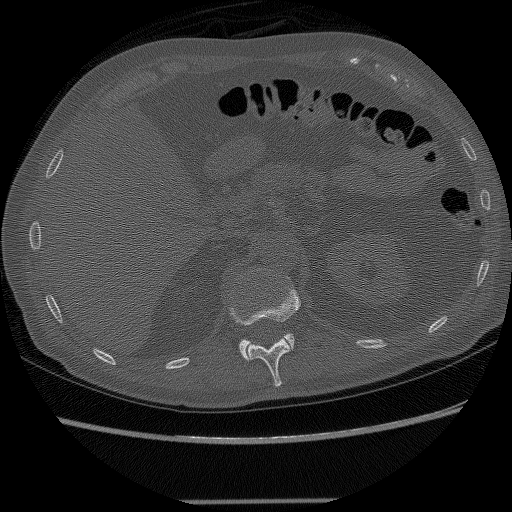

In [99]:
patient = 'ID00007637202177411956430'
preprocess(f"{DATA}/{patient}")
filename = f"tmp/{patient}.gif"
imageio.mimsave(filename, scan_array, duration=0.0001)
IPython.display.Image(filename, format='png')                     

Lossy conversion from int16 to uint8. Range [-1024, 1977]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2142]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2110]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2330]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2100]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 1893]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2032]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from int16 to uint8. Range [-1024, 2105]. Convert image to uint8 prior to saving to suppress this warning.
Lossy co

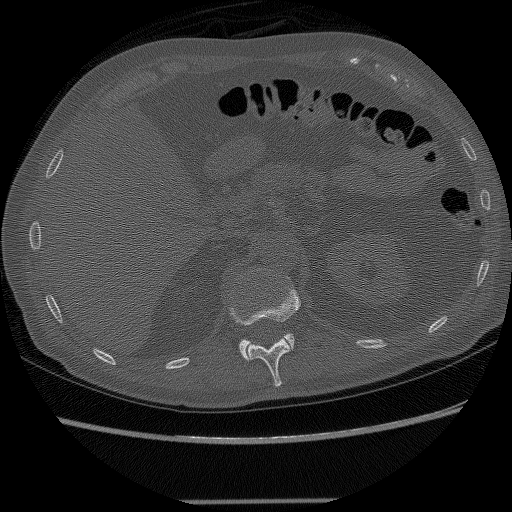

In [100]:
patient = 'ID00186637202242472088675'
preprocess(f"{DATA}/{patient}")
filename = f"tmp/{patient}.gif"
imageio.mimsave(filename, scan_array, duration=0.0001)
IPython.display.Image(filename, format='png')   